### Question 1

Text(0.5, 1.0, 'Intensity Transformation Curve')

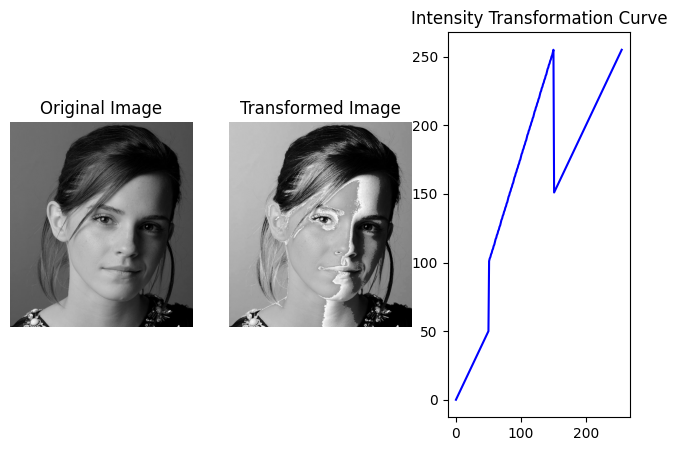

In [291]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

emmaImg=cv.imread("images/emma.jpg",cv.IMREAD_GRAYSCALE)

in_intensity=np.arange(256, dtype=np.uint8)# an array of unsigned 8 bit integers from 0 to 255

#initalizing the output Intensity array
out_intensity=np.zeros(256, dtype=np.uint8)# an array of zeros with the same size as in_intensity

# Define the transformation curve
out_intensity[:51]=1*in_intensity[:51]
out_intensity[51:151]=1.55*(in_intensity[51:151]-50)+100
out_intensity[151:256]=1*(in_intensity[151:256])

# Create a figure with 3 subplots
fig, ax = plt.subplots(1,3, figsize=(8,5))

ax[0].imshow(emmaImg, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(cv.LUT(emmaImg, out_intensity), cmap='gray')
ax[1].set_title("Transformed Image")
ax[1].axis("off")

ax[2].plot(in_intensity, out_intensity, color='Blue')
ax[2].set_title("Intensity Transformation Curve")  


### Question 2

Text(0.5, 1.0, 'Intensity Transformation Curve for White Matter')

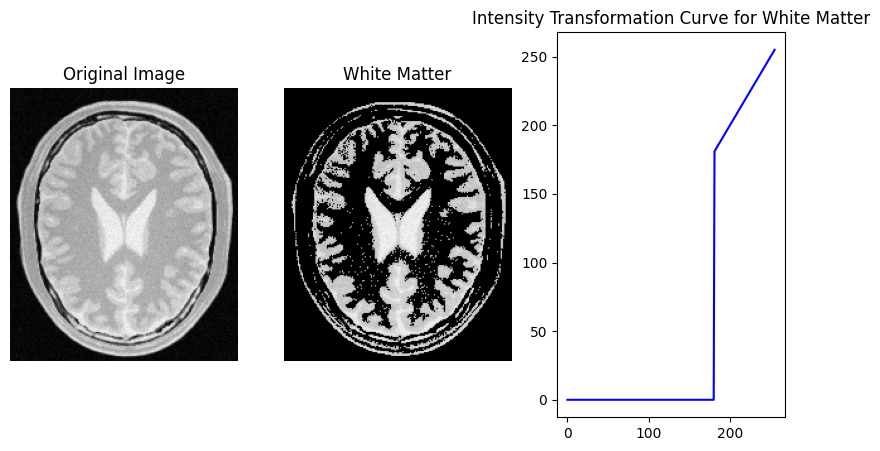

In [292]:
brainImg=cv.imread("images/brain_proton_density_slice.png", cv.IMREAD_GRAYSCALE)

in_intensity=np.arange(256, dtype=np.uint8)# an array of unsigned 8 bit integers from 0 to 255
#initalizing the output Intensity array
out_intensity=np.zeros(256, dtype=np.uint8)# an array of zeros with the same size as in_intensity
threshold=180
# Define the transformation curve
out_intensity[:threshold]=0
out_intensity[threshold+1:256]=1*(in_intensity[threshold+1:256])

fig, ax = plt.subplots(1,3, figsize=(10,5))

ax[0].imshow(brainImg, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(cv.LUT(brainImg, out_intensity), cmap='gray')
ax[1].set_title("White Matter")
ax[1].axis("off")


ax[2].plot(in_intensity, out_intensity, color='Blue')
ax[2].set_title("Intensity Transformation Curve for White Matter")

Text(0.5, 1.0, 'Intensity Transformation Curve for Gray Matter')

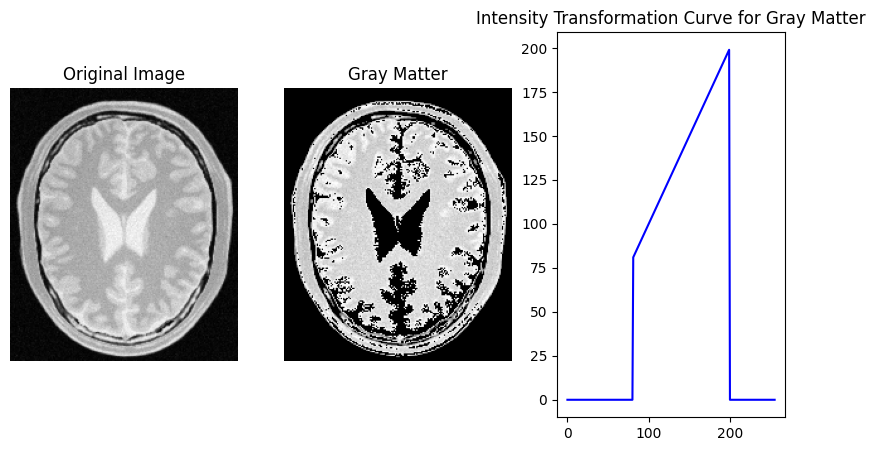

In [293]:
brainImg=cv.imread("images/brain_proton_density_slice.png", cv.IMREAD_GRAYSCALE)

in_intensity=np.arange(256, dtype=np.uint8)# an array of unsigned 8 bit integers from 0 to 255
#initalizing the output Intensity array
out_intensity=np.zeros(256, dtype=np.uint8)# an array of zeros with the same size as in_intensity
upbound=200
lowbound=80
# Define the transformation curve
out_intensity[:lowbound]=0
out_intensity[lowbound+1:upbound]=1*(in_intensity[lowbound+1:upbound])
out_intensity[upbound+1:256]=0

fig, ax = plt.subplots(1,3, figsize=(10,5))

ax[0].imshow(brainImg, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(cv.LUT(brainImg, out_intensity), cmap='gray')
ax[1].set_title("Gray Matter")
ax[1].axis("off")


ax[2].plot(in_intensity, out_intensity, color='Blue')
ax[2].set_title("Intensity Transformation Curve for Gray Matter")

### Question 3

C:\Users\94701\AppData\Local\Temp\ipykernel_15616\2703778624.py:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].bar(Pix_intensity,np.log10(Blue_hist.flatten()),color='blue')
C:\Users\94701\AppData\Local\Temp\ipykernel_15616\2703778624.py:33: RuntimeWarning: divide by zero encountered in log10
  ax[1].bar(Pix_intensity,np.log10(After_Red_hist.flatten()),color='red')
C:\Users\94701\AppData\Local\Temp\ipykernel_15616\2703778624.py:34: RuntimeWarning: divide by zero encountered in log10
  ax[1].bar(Pix_intensity,np.log10(After_Green_hist.flatten()),color='green')
C:\Users\94701\AppData\Local\Temp\ipykernel_15616\2703778624.py:35: RuntimeWarning: divide by zero encountered in log10
  ax[1].bar(Pix_intensity,np.log10(After_Blue_hist.flatten()),color='blue')


Text(0.5, 1.0, 'Intensity Transformation Curve for Gamma Correction')

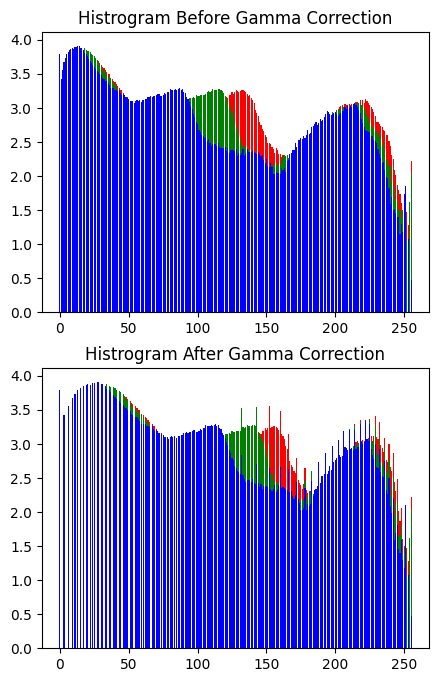

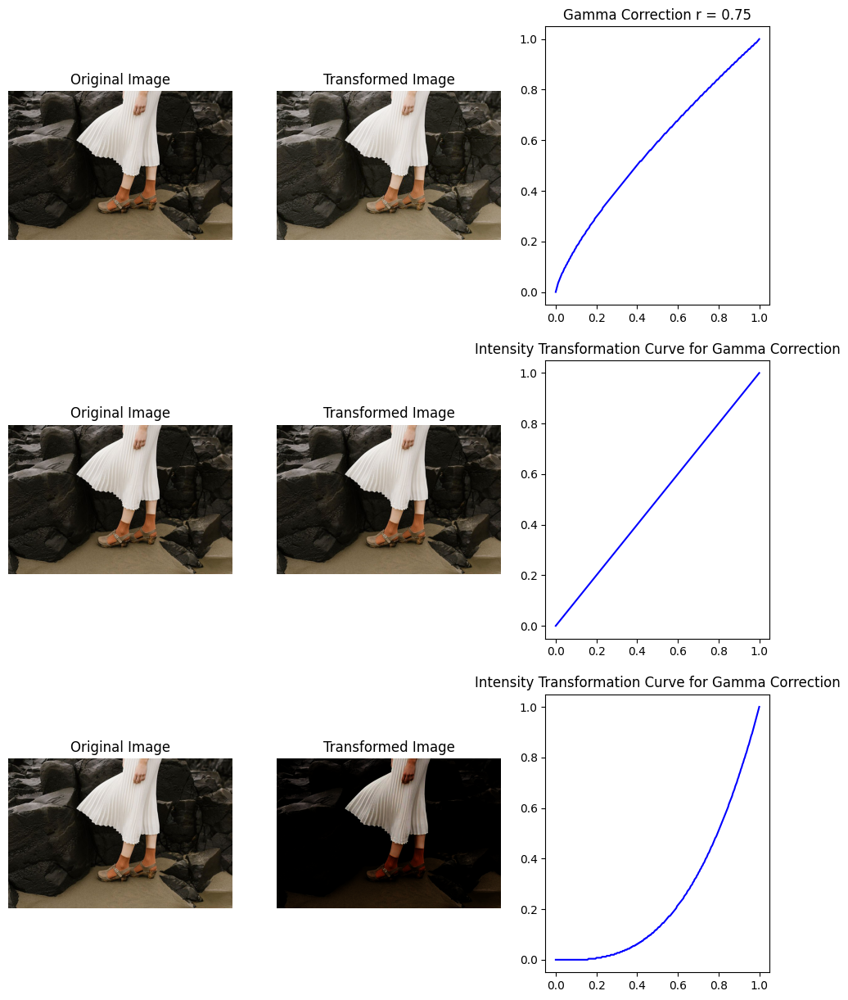

In [302]:
image_gamma=cv.imread("images/highlights_and_shadows.jpg")
image_gamma=cv.cvtColor(image_gamma,cv.COLOR_BGR2RGB)


in_intensity=np.arange(256, dtype=np.uint8)
out_intensity=np.zeros(256, dtype=np.uint8)
gamma=0.75
out_intensity= (((in_intensity/255)**(gamma))*255).astype(np.uint8)
GamaCorrected=cv.LUT(image_gamma, out_intensity)

#Histogram Calculation for R G B Before Gamma Correction
Red_hist = cv.calcHist([image_gamma], [0], None, [256], [0, 256])
Green_hist = cv.calcHist([image_gamma], [1], None, [256], [0, 256])
Blue_hist = cv.calcHist([image_gamma], [2], None, [256], [0, 256])
Pix_intensity = np.arange(256)

#Histogram Calculation for R G B After Gamma Correction
After_Red_hist = cv.calcHist([GamaCorrected], [0], None, [256], [0, 256])
After_Green_hist = cv.calcHist([GamaCorrected], [1], None, [256], [0, 256])
After_Blue_hist = cv.calcHist([GamaCorrected], [2], None, [256], [0, 256])
Pix_intensity = np.arange(256)

fig, ax = plt.subplots(2,1,figsize=(5,8))

#Used Log scale to visualize the variation
ax[0].bar(Pix_intensity,np.log10(Red_hist.flatten()),color='red')
ax[0].bar(Pix_intensity,np.log10(Green_hist.flatten()),color='green')
ax[0].bar(Pix_intensity,np.log10(Blue_hist.flatten()),color='blue')
ax[0].set_title("Histrogram Before Gamma Correction")



ax[1].bar(Pix_intensity,np.log10(After_Red_hist.flatten()),color='red')
ax[1].bar(Pix_intensity,np.log10(After_Green_hist.flatten()),color='green')
ax[1].bar(Pix_intensity,np.log10(After_Blue_hist.flatten()),color='blue')
ax[1].set_title("Histrogram After Gamma Correction")


fig, ax = plt.subplots(3,3, figsize=(12,15))

ax[0,0].imshow(image_gamma, cmap='gray')
ax[0,0].set_title("Original Image")
ax[0,0].axis("off")

ax[0,1].imshow(cv.LUT(image_gamma, out_intensity), cmap='gray')
ax[0,1].set_title("Transformed Image")
ax[0,1].axis("off")

ax[0,2].plot(in_intensity/255, out_intensity/255, color='Blue')
ax[0,2].set_title("Gamma Correction r = 0.75")

gamma=1
out_intensity= (((in_intensity/255)**(gamma))*255).astype(np.uint8)
#print(out_intensity)

ax[1,0].imshow(image_gamma)
ax[1,0].set_title("Original Image")
ax[1,0].axis("off")

ax[1,1].imshow(cv.LUT(image_gamma, out_intensity))
ax[1,1].set_title("Transformed Image")
ax[1,1].axis("off")

ax[1,2].plot(in_intensity/255, out_intensity/255, color='Blue')
ax[1,2].set_title("Intensity Transformation Curve for Gamma Correction")

gamma=3
out_intensity= (((in_intensity/255)**(gamma))*255).astype(np.uint8)
#print(out_intensity)

ax[2,0].imshow(image_gamma, cmap='gray')
ax[2,0].set_title("Original Image")
ax[2,0].axis("off")

ax[2,1].imshow(cv.LUT(image_gamma, out_intensity), cmap='gray')
ax[2,1].set_title("Transformed Image")
ax[2,1].axis("off")

ax[2,2].plot(in_intensity/255, out_intensity/255, color='Blue')
ax[2,2].set_title("Intensity Transformation Curve for Gamma Correction")


### Question 4

(np.float64(-0.5), np.float64(779.5), np.float64(437.5), np.float64(-0.5))

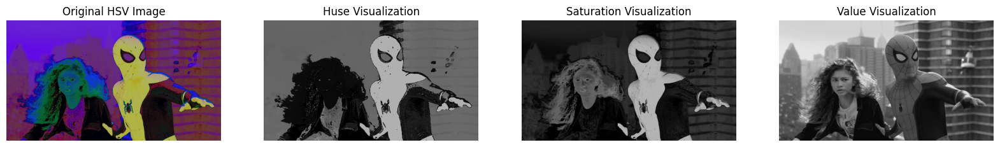

In [304]:
#part a:
spider_img = cv.imread("images/spider.png")
spider_img_HSV = cv.cvtColor(spider_img, cv.COLOR_BGR2HSV)

fig, ax=plt.subplots(1,4, figsize=(20,8))
ax[0].imshow(spider_img_HSV, cmap='gray', vmin=0, vmax=255)
ax[0].set_title("Original HSV Image")
ax[0].axis("off")

ax[1].imshow(spider_img_HSV[:,:,0],cmap='gray', vmin=0, vmax=255)
ax[1].set_title("Huse Visualization")
ax[1].axis("off")

ax[2].imshow(spider_img_HSV[:,:,1],cmap='gray', vmin=0, vmax=255)
ax[2].set_title("Saturation Visualization")   
ax[2].axis("off")

ax[3].imshow(spider_img_HSV[:,:,2],cmap='gray', vmin=0, vmax=255)
ax[3].set_title("Value Visualization")
ax[3].axis("off")



(np.float64(-0.5), np.float64(779.5), np.float64(437.5), np.float64(-0.5))

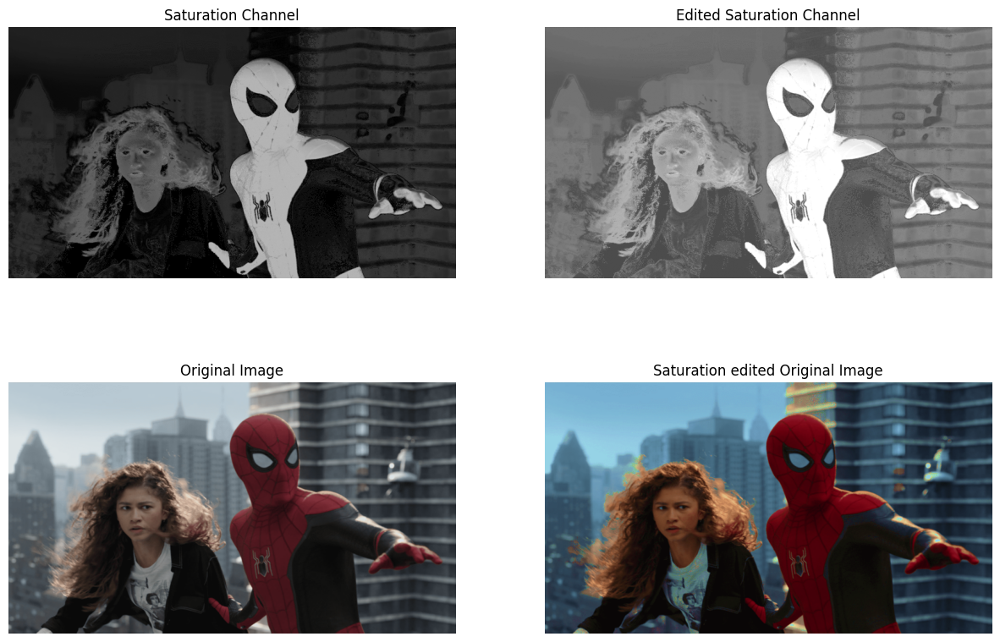

In [257]:
out_inten_sat=[]
#part b:
saturation_img=spider_img_HSV[:,:,1]  
copy_img=spider_img_HSV.copy()

#part c:
zigma=70
a=0.6# a E [0,1]

edited_saturation_img = np.minimum(saturation_img + a *128* np.exp(-((saturation_img-128)**2)/(2*zigma**2)), 255).astype(np.uint8)

#Displaying the output intensity array
fig, ax = plt.subplots(2,2, figsize=(15,10))
ax[0,0].imshow(saturation_img,cmap='gray', vmin=0, vmax=255)
ax[0,0].set_title("Saturation Channel")
ax[0,0].axis("off")

ax[0,1].imshow(edited_saturation_img,cmap='gray', vmin=0, vmax=255)
ax[0,1].set_title("Edited Saturation Channel")
ax[0,1].axis("off")

#part d:
copy_img[:,:,1] = edited_saturation_img

ax[1,0].imshow(cv.cvtColor(spider_img, cv.COLOR_BGR2RGB))
ax[1,0].set_title("Original Image")
ax[1,0].axis("off")

ax[1,1].imshow(cv.cvtColor(copy_img, cv.COLOR_HSV2RGB))
ax[1,1].set_title("Saturation edited Original Image")
ax[1,1].axis("off")

Text(0, 0.5, 'Output Intensity')

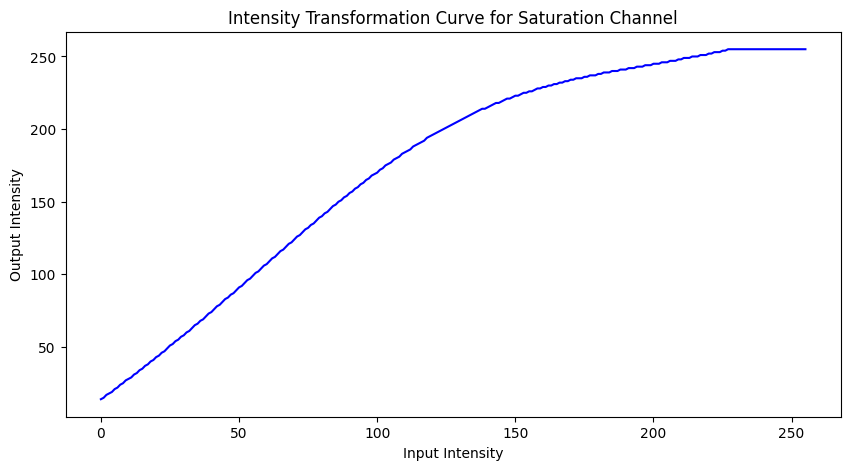

In [258]:
#part e
in_intensity=np.arange(0,256)
out_intensity=np.minimum(in_intensity + a *128* np.exp(-((in_intensity-128)**2)/(2*zigma**2)), 255).astype(np.uint8)

#out_intensity=np.minimum(in_intensity + a * 128 * np.exp(-((in_intensity - 128)**2) / (2 * zigma**2)), 255).astype('uint8')


fig, ax = plt.subplots(figsize=(10,5))  
ax.plot(in_intensity, out_intensity, color='Blue')
ax.set_title("Intensity Transformation Curve for Saturation Channel")
ax.set_xlabel("Input Intensity")
ax.set_ylabel("Output Intensity")


### Question 5


Text(0.5, 0, 'Pixel Intensity')

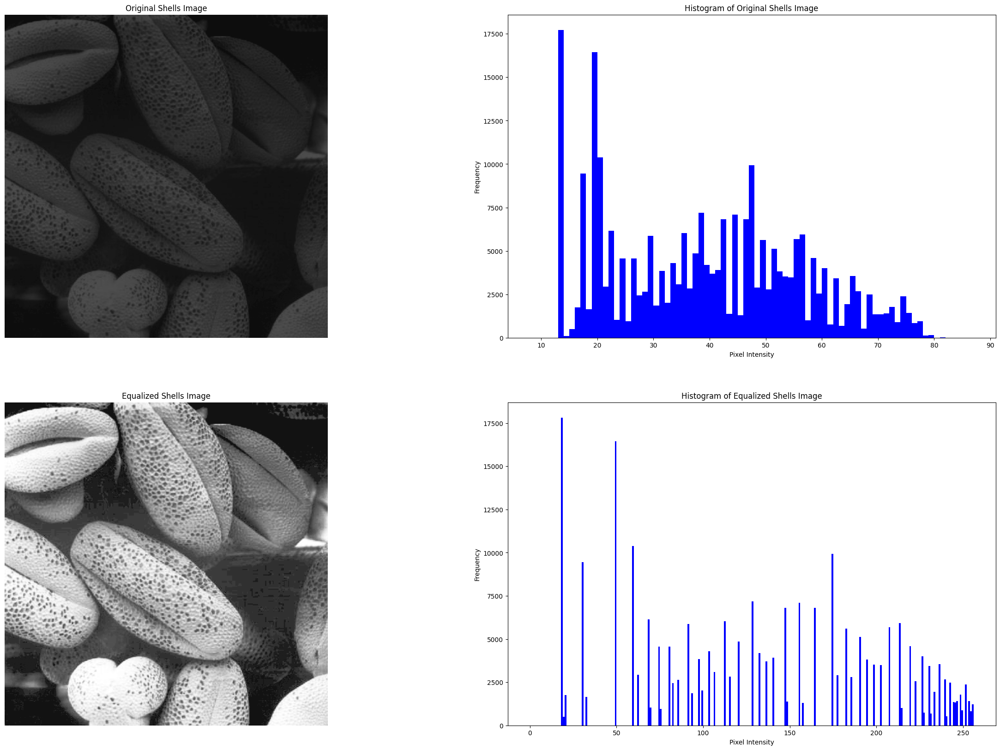

In [259]:
def equlization(flatArray):

    frequency = np.bincount(flatArray, minlength=256)
    cdf = np.cumsum(frequency)
    cdf_normalized = np.round((255 * cdf) / cdf[-1]).astype(np.uint8) #function

    return cdf_normalized, frequency

shells_img = cv.imread("images/shells.tif", cv.IMREAD_GRAYSCALE)
flatArray = shells_img.ravel()
maxval, minval = np.max(shells_img), np.min(shells_img)

fig, ax = plt.subplots(2, 2, figsize=(30, 20))

ax[0,0].imshow(shells_img, cmap='gray',vmin=0, vmax=255)
ax[0,0].set_title("Original Shells Image")
ax[0,0].axis("off")

ax[0,1].hist(flatArray, bins=np.arange(minval-5, maxval+5), color='blue', alpha=1, rwidth=1)
ax[0,1].set_title("Histogram of Original Shells Image")
ax[0,1].set_ylabel("Frequency")
ax[0,1].set_xlabel("Pixel Intensity")

cdf_normalized, frequency = equlization(flatArray)
equalized_flat = cdf_normalized[flatArray]  # Apply mapping
equalized_img = equalized_flat.reshape(shells_img.shape)

ax[1,0].imshow(equalized_img, cmap='gray',vmin=0, vmax=255)
ax[1,0].set_title("Equalized Shells Image")
ax[1,0].axis("off")

ax[1,1].hist(equalized_flat, bins=np.arange(257), color='blue', alpha=1, rwidth=1)
ax[1,1].set_title("Histogram of Equalized Shells Image")
ax[1,1].set_ylabel("Frequency")
ax[1,1].set_xlabel("Pixel Intensity")


### Question 6

(np.float64(-0.5), np.float64(3839.5), np.float64(2159.5), np.float64(-0.5))

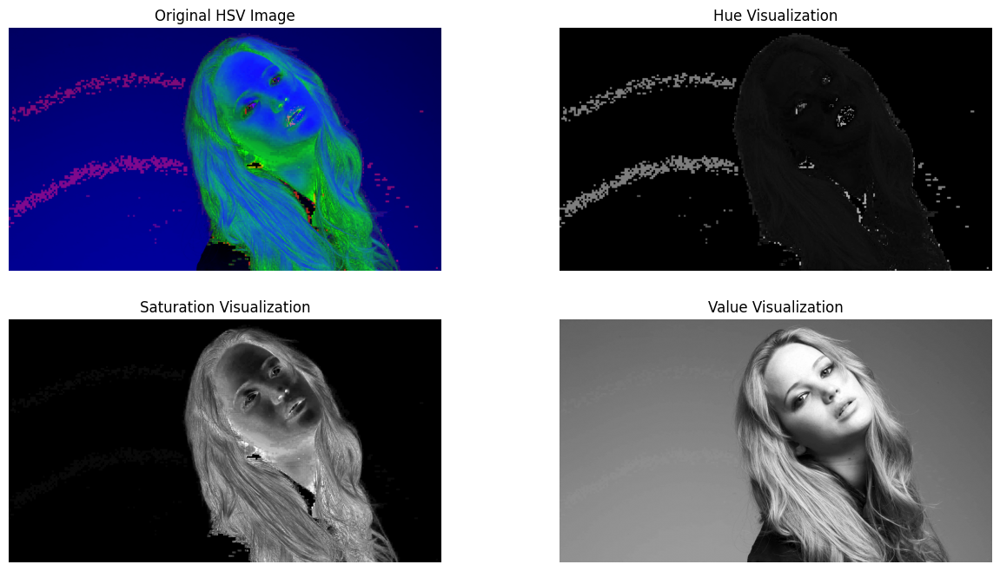

In [260]:
#part a:
jeniffer_img = cv.imread("images/jeniffer.jpg")
jeniffer_img_HSV = cv.cvtColor(jeniffer_img, cv.COLOR_BGR2HSV)

fig, ax = plt.subplots(2, 2, figsize=(15, 8))

ax[0, 0].imshow(jeniffer_img_HSV, cmap='gray',vmin=0, vmax=255)
ax[0, 0].set_title("Original HSV Image")
ax[0, 0].axis("off")

ax[0, 1].imshow(jeniffer_img_HSV[:, :, 0], cmap='gray',vmin=0, vmax=255)
ax[0, 1].set_title("Hue Visualization")
ax[0, 1].axis("off")

ax[1, 0].imshow(jeniffer_img_HSV[:, :, 1], cmap='gray',vmin=0, vmax=255)
ax[1, 0].set_title("Saturation Visualization")
ax[1, 0].axis("off")

ax[1, 1].imshow(jeniffer_img_HSV[:, :, 2], cmap='gray',vmin=0, vmax=255)
ax[1, 1].set_title("Value Visualization")
ax[1, 1].axis("off")



(np.float64(-0.5), np.float64(3839.5), np.float64(2159.5), np.float64(-0.5))

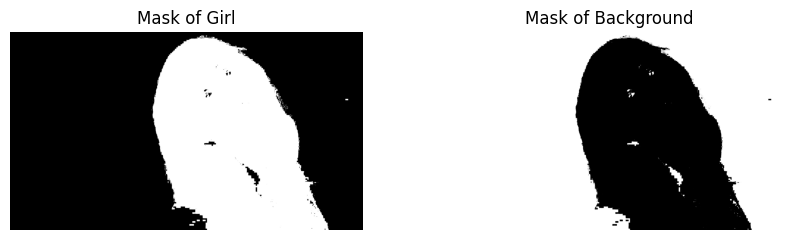

In [261]:
s_channel = jeniffer_img_HSV[:, :, 1]  # Saturation channel is choosed

black_th = 12
white_th = 12

# Background mask
girl_mask = np.where(s_channel < black_th, 0, 255).astype(np.uint8)
# Girl mask
backgroud_mask = np.where(s_channel > white_th, 0, 255).astype(np.uint8)

#Display
fig, ax = plt.subplots(1,2,figsize=(10,5))
ax[0].imshow(girl_mask,cmap='gray')
ax[0].set_title('Mask of Girl')
ax[0].axis('off')

ax[1].imshow(backgroud_mask,cmap='gray')
ax[1].set_title('Mask of Background')
ax[1].axis('off')

(np.float64(-0.5), np.float64(3839.5), np.float64(2159.5), np.float64(-0.5))

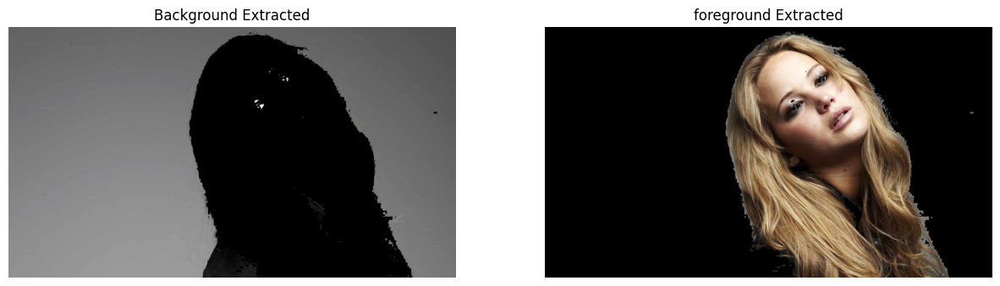

In [262]:
background = cv.bitwise_and(jeniffer_img, jeniffer_img, mask=backgroud_mask)
foreground=cv.bitwise_and(jeniffer_img, jeniffer_img, mask=girl_mask)

fig, ax = plt.subplots(1,2,figsize=(15,8))

ax[0].imshow(cv.cvtColor(background, cv.COLOR_BGR2RGB))
ax[0].set_title('Background Extracted')
ax[0].axis('off')

ax[1].imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
ax[1].set_title('foreground Extracted')
ax[1].axis('off')


Text(0, 0.5, 'Frequency')

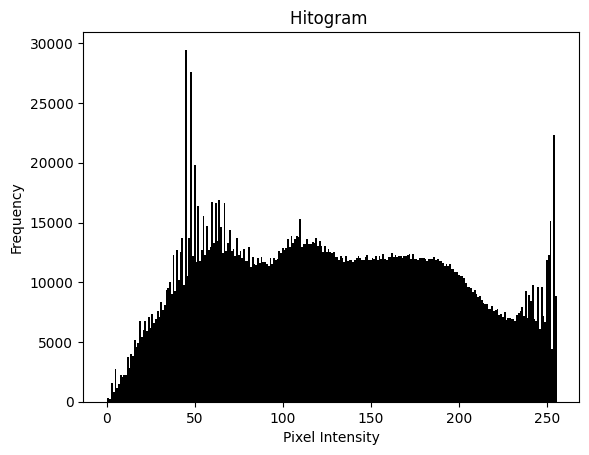

In [263]:
foreground_hSV =cv.cvtColor(foreground,cv.COLOR_BGR2HSV)

# Value histogram
hist_val = cv.calcHist([foreground_hSV], [2], girl_mask, [256], [0, 256])

Pix_intensity = np.arange(256)

plt.figure()
plt.bar(Pix_intensity, hist_val.flatten(), color='black', width=1)
plt.title("Hitogram ")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

Text(0, 0.5, 'Frequency')

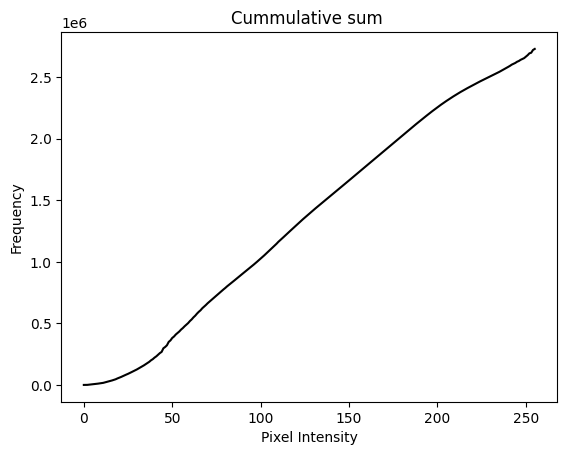

In [264]:
cdf = np.cumsum(hist_val.flatten())
Pix_intensity = np.arange(256)

plt.figure()
plt.plot(cdf, color='black')
plt.title("Cummulative sum ")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

### Error Goes Here

In [265]:
# flatArray=foreground_hSV[:,:,2].ravel()

# frequency = np.bincount(flatArray, minlength=256)
# # ok for now
# #print(np.min(flatArray))
# cdf = np.cumsum(frequency)
# cdf_normalized = np.round((255 * cdf) / cdf[-1]).astype(np.uint8)
# equalized_flat = cdf_normalized[flatArray]  # Apply mapping
# print(np.min(equalized_flat))
# equalized_img = equalized_flat.reshape(foreground_hSV[:,:,2].shape)

# hist_val = cv.calcHist([equalized_img], [0], girl_mask, [256], [0, 256])
# Pix_intensity = np.arange(256)

# plt.figure()
# plt.bar(Pix_intensity, hist_val.flatten(), color='black', width=1)
# #plt.hist(equalized_flat, bins=np.arange(257), color='blue', alpha=1, rwidth=1)
# plt.title('Equalized Histogram of Value Channel for Foreground')
# plt.xlabel('Pixel Intensity')
# plt.ylabel('Frequency')
# plt.xlim([0, 256])  # Set x-axis limits
# plt.grid(True)
# plt.show()




### Error Fixed

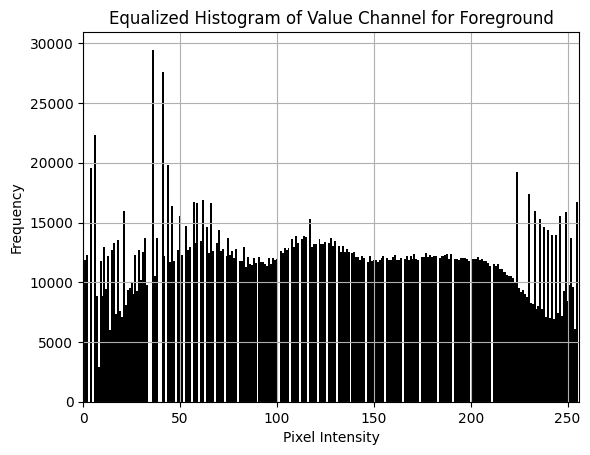

In [266]:
flatArray = foreground_hSV[:, :, 2].ravel()
frequency = np.bincount(flatArray, minlength=256)
cdf = np.cumsum(frequency)

cdf_m = np.round((cdf  * 255) / (cdf.max() - cdf.min()))
cdf_normalized = np.ma.filled(cdf_m, 0).astype(np.uint8)

equalized_flat = cdf_normalized[flatArray]# Apply mapping
equalized_img = equalized_flat.reshape(foreground_hSV[:, :, 2].shape)

# Histogram for masked region
hist_val = cv.calcHist([equalized_img], [0], girl_mask, [256], [0, 256])
Pix_intensity = np.arange(256)

plt.figure()
plt.bar(Pix_intensity, hist_val.flatten(), color='black', width=1)
plt.title('Equalized Histogram of Value Channel for Foreground')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256]) 
plt.grid(True)
plt.show()




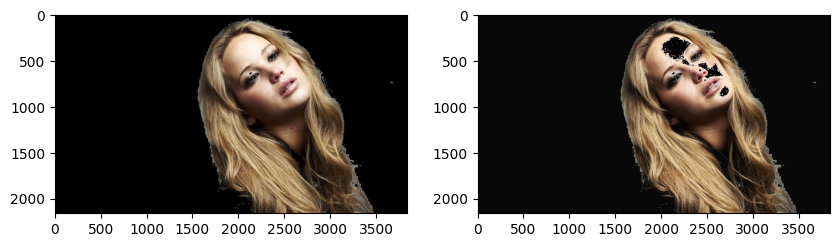

In [267]:
copyImg=foreground_hSV
copyImg[:, :, 2]=equalized_img

fig, ax=plt.subplots(1,2,figsize=(10,5))

ax[0].imshow(cv.cvtColor(foreground,cv.COLOR_BGR2RGB))

ax[1].imshow(cv.cvtColor(copyImg,cv.COLOR_HSV2RGB))

### Question 6 (Seccond Attempt)

#### (a) Open the image in Fig. 6, split it into hue, saturation, and values and display these planes in grayscale.

(np.float64(-0.5), np.float64(3839.5), np.float64(2159.5), np.float64(-0.5))

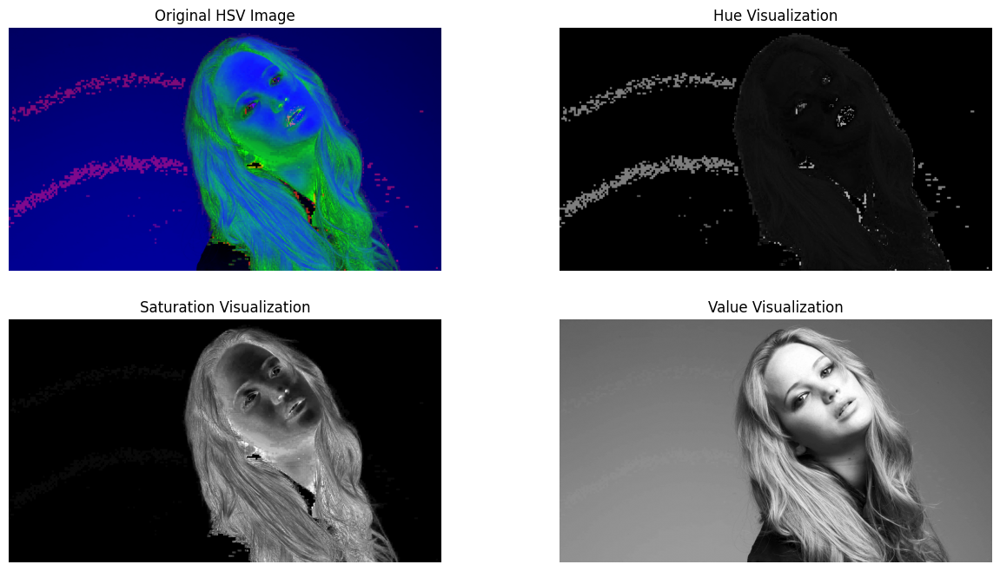

In [268]:
#part a:
jeniffer_img = cv.imread("images/jeniffer.jpg")
jeniffer_img_HSV = cv.cvtColor(jeniffer_img, cv.COLOR_BGR2HSV)

fig, ax = plt.subplots(2, 2, figsize=(15, 8))

ax[0, 0].imshow(jeniffer_img_HSV, cmap='gray',vmin=0, vmax=255)
ax[0, 0].set_title("Original HSV Image")
ax[0, 0].axis("off")

ax[0, 1].imshow(jeniffer_img_HSV[:, :, 0], cmap='gray',vmin=0, vmax=255)
ax[0, 1].set_title("Hue Visualization")
ax[0, 1].axis("off")

ax[1, 0].imshow(jeniffer_img_HSV[:, :, 1], cmap='gray',vmin=0, vmax=255)
ax[1, 0].set_title("Saturation Visualization")
ax[1, 0].axis("off")

ax[1, 1].imshow(jeniffer_img_HSV[:, :, 2], cmap='gray',vmin=0, vmax=255)
ax[1, 1].set_title("Value Visualization")
ax[1, 1].axis("off")



####  (b) Select the appropriate plane to threshold in extract the foreground mask. A mask is a binary image.

(np.float64(-0.5), np.float64(3839.5), np.float64(2159.5), np.float64(-0.5))

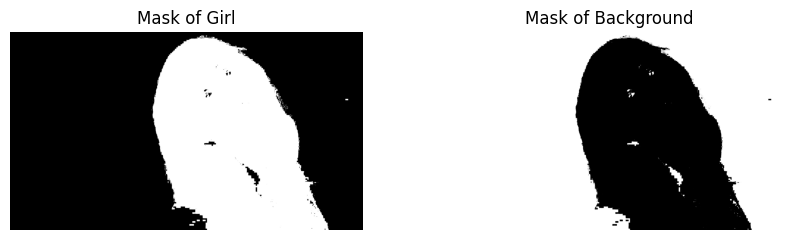

In [269]:
s_channel = jeniffer_img_HSV[:, :, 1]  # Saturation channel is choosed

black_th = 12
white_th = 12

# Background mask
girl_mask = np.where(s_channel < black_th, 0, 255).astype(np.uint8)
# Girl mask
backgroud_mask = np.where(s_channel > white_th, 0, 255).astype(np.uint8)

#Display
fig, ax = plt.subplots(1,2,figsize=(10,5))
ax[0].imshow(girl_mask,cmap='gray')
ax[0].set_title('Mask of Girl')
ax[0].axis('off')

ax[1].imshow(backgroud_mask,cmap='gray')
ax[1].set_title('Mask of Background')
ax[1].axis('off')

#### (c) Now obtain the foreground only using cv.bitwise_and and compute the histogram.

(np.float64(-0.5), np.float64(3839.5), np.float64(2159.5), np.float64(-0.5))

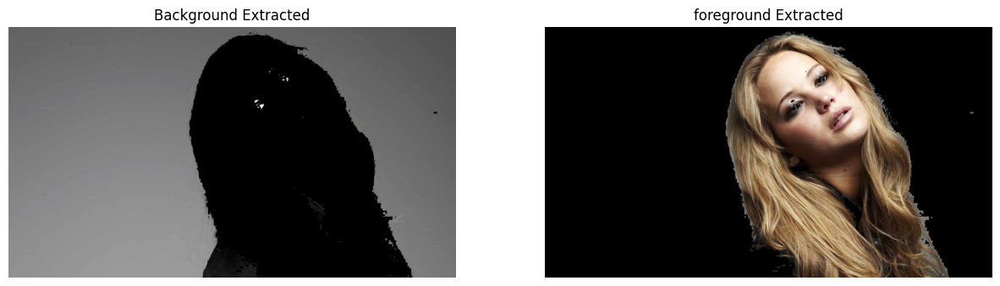

In [270]:
background = cv.bitwise_and(jeniffer_img, jeniffer_img, mask=backgroud_mask)
foreground=cv.bitwise_and(jeniffer_img, jeniffer_img, mask=girl_mask)

fig, ax = plt.subplots(1,2,figsize=(15,8))

ax[0].imshow(cv.cvtColor(background, cv.COLOR_BGR2RGB))
ax[0].set_title('Background Extracted')
ax[0].axis('off')

ax[1].imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
ax[1].set_title('foreground Extracted')
ax[1].axis('off')


C:\Users\94701\AppData\Local\Temp\ipykernel_15616\3339791923.py:19: RuntimeWarning: divide by zero encountered in log10
  ax[2].bar(Pix_intensity,np.log10(Blue_hist.flatten()),color='blue')


Text(0.5, 1.0, 'BLUE Channel')

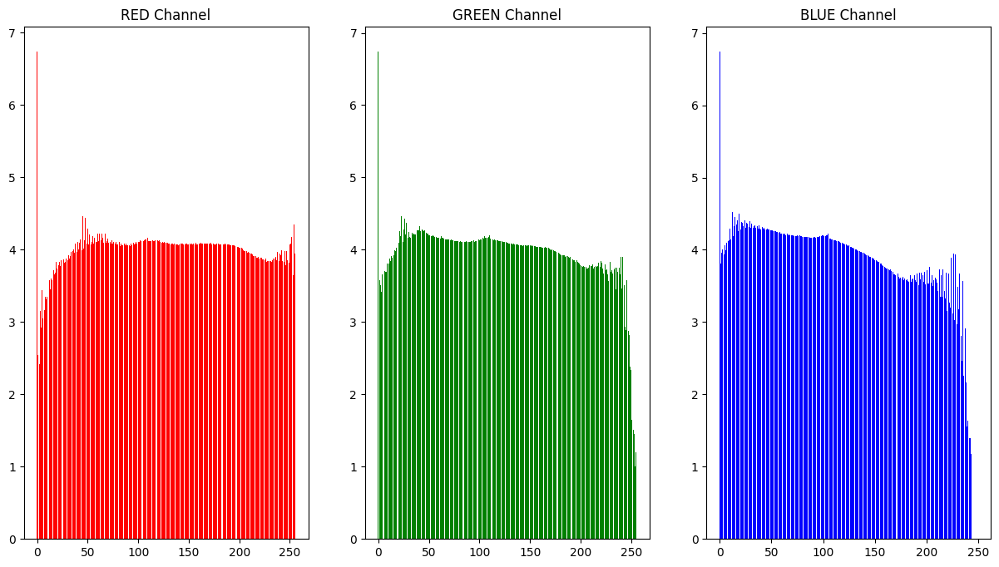

In [271]:
#RGB Image
forground_RGB=cv.cvtColor(foreground, cv.COLOR_BGR2RGB)

#Histogram Calculation for R G B
Red_hist = cv.calcHist([forground_RGB], [0], None, [256], [0, 256])
Green_hist = cv.calcHist([forground_RGB], [1], None, [256], [0, 256])
Blue_hist = cv.calcHist([forground_RGB], [2], None, [256], [0, 256])
Pix_intensity = np.arange(256)

fig, ax = plt.subplots(1,3,figsize=(15,8))

#Used Log scale to visualize the variation
ax[0].bar(Pix_intensity,np.log10(Red_hist.flatten()),color='red')
ax[0].set_title('RED Channel')

ax[1].bar(Pix_intensity,np.log10(Green_hist.flatten()),color='green')
ax[1].set_title('GREEN Channel')

ax[2].bar(Pix_intensity,np.log10(Blue_hist.flatten()),color='blue')
ax[2].set_title('BLUE Channel')



#### (d) Obtain the cumulative sum of the histogram using np.cumsum.

Text(0, 0.5, 'Frequency')

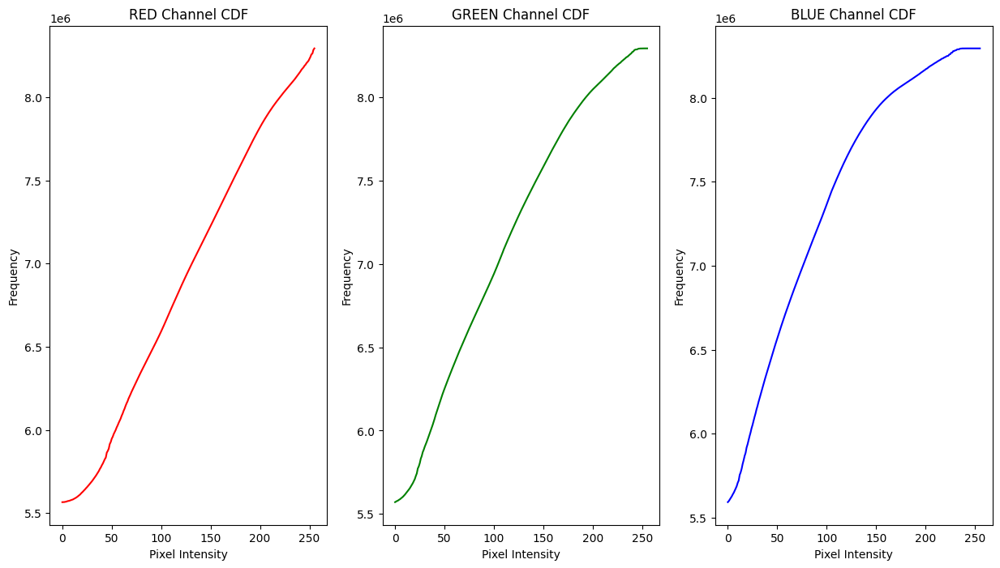

In [272]:
RED_cdf = np.cumsum(Red_hist.flatten())
Green_cdf = np.cumsum(Green_hist.flatten())
Blue_cdf = np.cumsum(Blue_hist.flatten())

Pix_intensity = np.arange(256)

fig, ax = plt.subplots(1,3,figsize=(15,8))

#Used Log scale to visualize the variation
ax[0].plot(RED_cdf,color='red')
ax[0].set_title('RED Channel CDF')
ax[0].set_xlabel("Pixel Intensity")
ax[0].set_ylabel("Frequency")

ax[1].plot(Green_cdf,color='green')
ax[1].set_title('GREEN Channel CDF')
ax[1].set_xlabel("Pixel Intensity")
ax[1].set_ylabel("Frequency")

ax[2].plot(Blue_cdf,color='blue')
ax[2].set_title('BLUE Channel CDF')
ax[2].set_xlabel("Pixel Intensity")
ax[2].set_ylabel("Frequency")


#### (e) Use the formulas in slides to histogram-equalize the foreground.

C:\Users\94701\AppData\Local\Temp\ipykernel_15616\1979568237.py:17: RuntimeWarning: divide by zero encountered in log10
  ax[0].bar(Pix_intensity,np.log10(Red_hist.flatten()),color='red')
C:\Users\94701\AppData\Local\Temp\ipykernel_15616\1979568237.py:20: RuntimeWarning: divide by zero encountered in log10
  ax[1].bar(Pix_intensity,np.log10(Green_hist.flatten()),color='green')
C:\Users\94701\AppData\Local\Temp\ipykernel_15616\1979568237.py:23: RuntimeWarning: divide by zero encountered in log10
  ax[2].bar(Pix_intensity,np.log10(Blue_hist.flatten()),color='blue')


Text(0.5, 1.0, 'BLUE Channel')

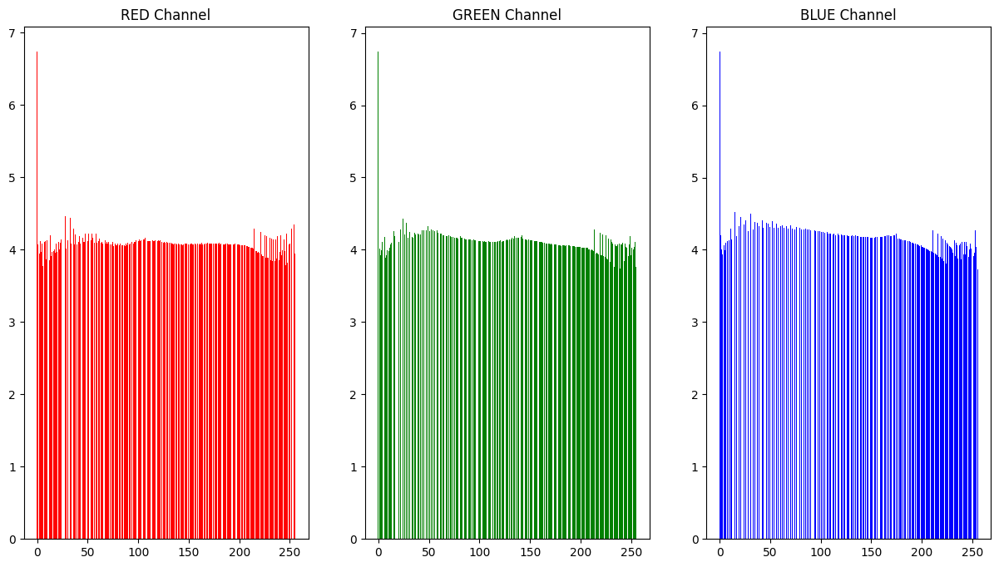

In [273]:
#Equlizing using the function equalizeHist
Red_equalized = cv.equalizeHist(forground_RGB[:, :, 0])
Green_equalized = cv.equalizeHist(forground_RGB[:, :, 1])
Blue_equalized = cv.equalizeHist(forground_RGB[:, :, 2])

equlizedImg=cv.merge((Red_equalized,Green_equalized,Blue_equalized))

#Histogram Calculation for R G B
Red_hist = cv.calcHist([equlizedImg], [0], None, [256], [0, 256])
Green_hist = cv.calcHist([equlizedImg], [1], None, [256], [0, 256])
Blue_hist = cv.calcHist([equlizedImg], [2], None, [256], [0, 256])
Pix_intensity = np.arange(256)

fig, ax = plt.subplots(1,3,figsize=(15,8))

#Used Log scale to visualize the variation
ax[0].bar(Pix_intensity,np.log10(Red_hist.flatten()),color='red')
ax[0].set_title('RED Channel')

ax[1].bar(Pix_intensity,np.log10(Green_hist.flatten()),color='green')
ax[1].set_title('GREEN Channel')

ax[2].bar(Pix_intensity,np.log10(Blue_hist.flatten()),color='blue')
ax[2].set_title('BLUE Channel')

(np.float64(-0.5), np.float64(3839.5), np.float64(2159.5), np.float64(-0.5))

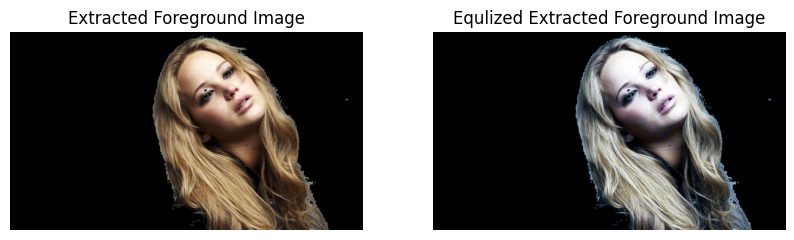

In [274]:
fig, ax=plt.subplots(1,2,figsize=(10,5))

ax[0].imshow(forground_RGB)
ax[0].set_title('Extracted Foreground Image')
ax[0].axis('off')

ax[1].imshow(equlizedImg)
ax[1].set_title('Equlized Extracted Foreground Image')
ax[1].axis('off')

#### (f) Extract the background and add with the histogram equalized foreground

(np.float64(-0.5), np.float64(3839.5), np.float64(2159.5), np.float64(-0.5))

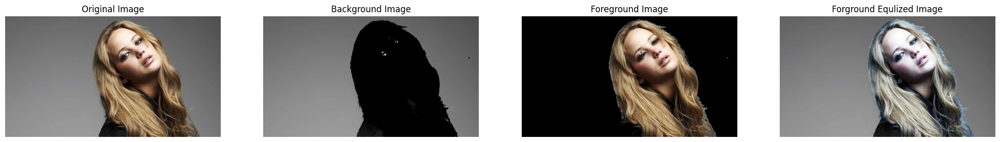

In [275]:
# Extract the background by bitwise_not
#background = cv.bitwise_and(img_orig, img_orig, mask=cv.bitwise_not(foreground_mask3))

finalImg = cv.add(cv.cvtColor(background, cv.COLOR_BGR2RGB), equlizedImg)
#final_modified_img_rgb = cv.cvtColor(final_modified_img, cv.COLOR_BGR2RGB)

fig, ax = plt.subplots(1, 4, figsize=(25, 8))

ax[0].imshow(cv.cvtColor(jeniffer_img, cv.COLOR_BGR2RGB))
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(cv.cvtColor(background, cv.COLOR_BGR2RGB))
ax[1].set_title("Background Image")
ax[1].axis("off")

ax[2].imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
ax[2].set_title("Foreground Image")
ax[2].axis("off")

ax[3].imshow(finalImg)
ax[3].set_title("Forground Equlized Image")
ax[3].axis("off")


### Question 7

#### (a) Using the existing filter2D to Sobel filter the image.

(np.float64(-0.5), np.float64(363.5), np.float64(379.5), np.float64(-0.5))

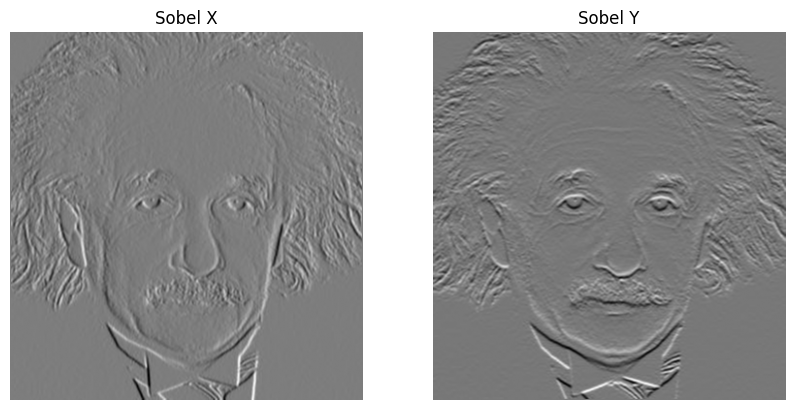

In [276]:
#Part a:
imgName = 'images/einstein.png'
img = cv.imread(imgName, cv.IMREAD_GRAYSCALE)
fig, ax= plt.subplots(1,2, figsize=(10,5))

sobel_x = np.array([[1, 0, -1],
                    [2, 0, -2], 
                    [1, 0, -1]])
sobel_y = np.array([[1, 2, 1],
                    [0, 0, 0], 
                    [-1, -2, -1]])
img_sobel_x = cv.filter2D(img, cv.CV_64F, sobel_x)
img_sobel_y = cv.filter2D(img, cv.CV_64F, sobel_y)

ax[0].imshow(img_sobel_x, cmap='gray')
ax[0].set_title("Sobel X")  
ax[0].axis("off")

ax[1].imshow(img_sobel_y, cmap='gray')
ax[1].set_title("Sobel Y")
ax[1].axis("off")

####  (b) Write your own code to Sobel filter the image.

(np.float64(-0.5), np.float64(363.5), np.float64(379.5), np.float64(-0.5))

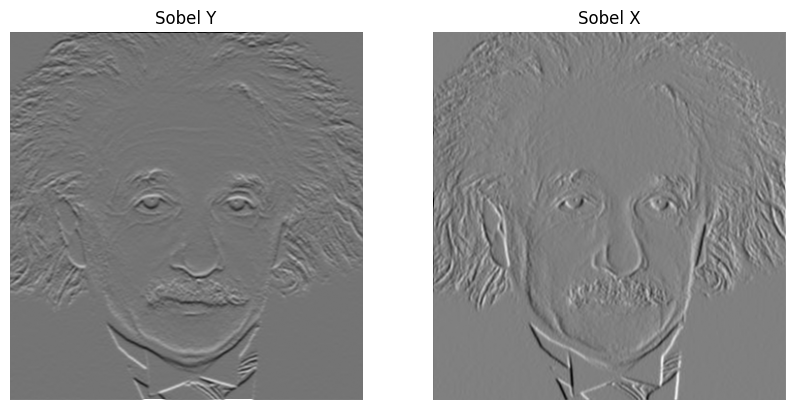

In [277]:
def sobelFilter(image,kernal):
    
    if len(image.shape) == 3:
        image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    img_padded = cv.copyMakeBorder(image, 
                               top=1, bottom=1, left=1, right=1,
                               borderType=cv.BORDER_CONSTANT, value=0)
    
    


    rows, cols = image.shape
    
    new_img = np.zeros((rows, cols), dtype=np.float64)
    for i in range(rows):
        for j in range(cols):
            block=img_padded[i:i+3,j:j+3]
            new_img[i,j]=np.sum(block*kernal)
    return new_img


img = cv.imread('images/einstein.png') # BGR Image
fig, ax= plt.subplots(1,2, figsize=(10,5))

sobel_x = np.array([[1, 0, -1],
                    [2, 0, -2], 
                    [1, 0, -1]])

sobel_y = np.array([[1, 2, 1],
                    [0, 0, 0], 
                    [-1, -2, -1]])


ax[1].imshow(sobelFilter(img,sobel_x), cmap='gray')
ax[1].set_title("Sobel X")  
ax[1].axis("off")

ax[0].imshow(sobelFilter(img,sobel_y), cmap='gray')
ax[0].set_title("Sobel Y")
ax[0].axis("off")

    

 #### (c) Using the property

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-727.0..752.0].


(np.float64(-0.5), np.float64(363.5), np.float64(379.5), np.float64(-0.5))

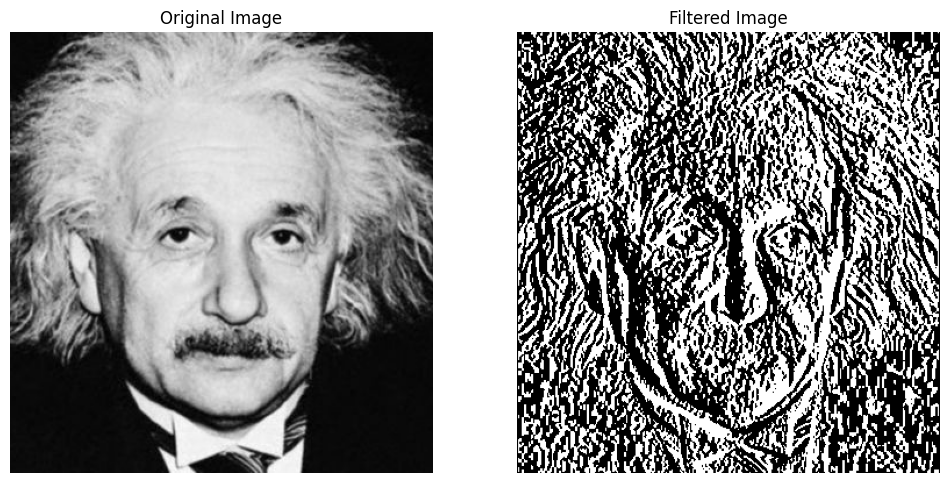

In [278]:
columnMat= np.array([(1), (2), (1)], dtype='float')   
rowMat = np.array([(1, 0, -1)], dtype='float')



Convol1 = cv.filter2D(img, cv.CV_64F, columnMat)
Convol2 = cv.filter2D(Convol1, cv.CV_64F, rowMat) 

fig, axes  = plt.subplots(1,2, sharex='all', sharey='all', figsize=(12,12))

axes[0].imshow(img, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(Convol2, cmap='gray')
axes[1].set_title('Filtered Image')
axes[1].axis('off')



### Question 8

In [279]:
def zoom_image(img, method, factor):    
    if (method == "nearest"):
        interpolation=cv.INTER_NEAREST
    else:
        interpolation=cv.INTER_LINEAR
    (h,w,_) = img.shape 
    new_size = (int( w * factor), int(h * factor))

    return cv.resize(img, new_size, interpolation=interpolation)

def normalized_ssd(img1, img2):
    if img1.shape != img2.shape:
        print("Images Do not have Same Dimentions")
        return
    
    diff = img1.astype(np.float32) - img2.astype(np.float32)
    ssd = np.sum(diff ** 2)
    norm_ssd = ssd / img1.size
    return norm_ssd

(np.float64(-0.5), np.float64(479.5), np.float64(299.5), np.float64(-0.5))

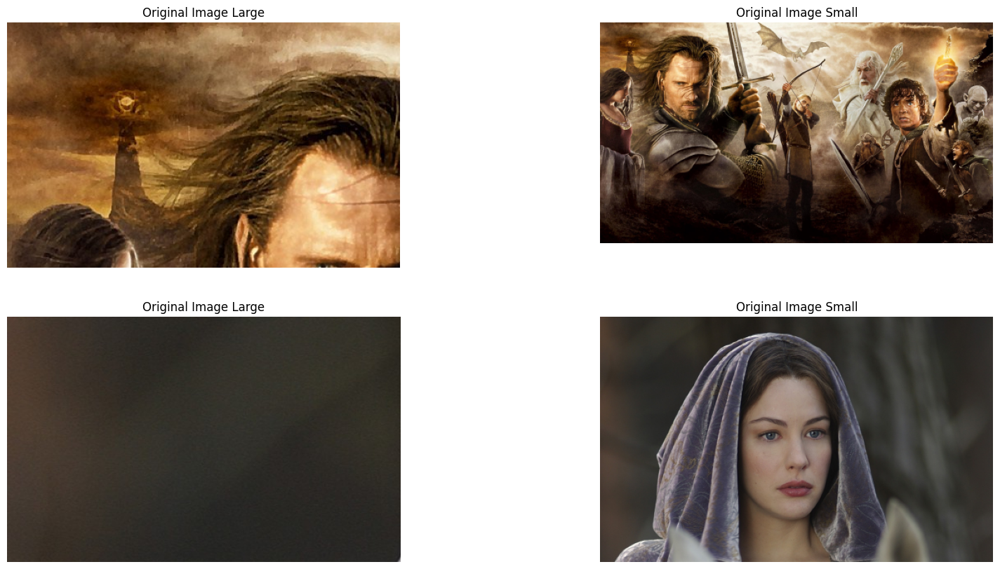

In [280]:
image1=cv.imread("images/a1q5images/im01.png")
image1=cv.cvtColor(image1, cv.COLOR_BGR2RGB)
image1Small=cv.imread("images/a1q5images/im01small.png")
image1Small=cv.cvtColor(image1Small, cv.COLOR_BGR2RGB)

image2=cv.imread("images/a1q5images/im02.png")
image2=cv.cvtColor(image2, cv.COLOR_BGR2RGB)
image2Small=cv.imread("images/a1q5images/im02small.png")
image2Small=cv.cvtColor(image2Small, cv.COLOR_BGR2RGB)

fig, axes  = plt.subplots(2,2, sharex='all', sharey='all', figsize=(20,10))

axes[0,0].imshow(image1)
axes[0,0].set_title('Original Image Large')
axes[0,0].axis('off')

axes[0,1].imshow(image1Small)
axes[0,1].set_title('Original Image Small')
axes[0,1].axis('off')

axes[1,0].imshow(image2)
axes[1,0].set_title('Original Image Large')
axes[1,0].axis('off')

axes[1,1].imshow(image2Small)
axes[1,1].set_title('Original Image Small')
axes[1,1].axis('off')


In [281]:
#For image 1
im1_zoomed_nn = zoom_image(image1Small, 'nearest',4)
im1_zoomed_bi = zoom_image(image1Small, 'bilinear',4)

nn_SSD_im1 = normalized_ssd(image1, im1_zoomed_nn)
bi_SSD_im1 = normalized_ssd(image1, im1_zoomed_bi)

print('Normalized SSD for Nearest Neighbour: ', nn_SSD_im1)
print('Normalized SSD for Bilinear: ', bi_SSD_im1)

#For image 2
im2_zoomed_nn = zoom_image(image2Small, 'nearest',4)
im2_zoomed_bi = zoom_image(image2Small, 'bilinear',4)

nn_SSD_im2 = normalized_ssd(image2, im2_zoomed_nn)
bi_SSD_im2 = normalized_ssd(image2, im2_zoomed_bi)

print('Normalized SSD for Nearest Neighbour: ', nn_SSD_im2)
print('Normalized SSD for Bilinear: ', bi_SSD_im2)

Normalized SSD for Nearest Neighbour:  136.26895
Normalized SSD for Bilinear:  115.09191
Normalized SSD for Nearest Neighbour:  26.446062
Normalized SSD for Bilinear:  18.34592


(np.float64(-0.5), np.float64(1919.5), np.float64(1199.5), np.float64(-0.5))

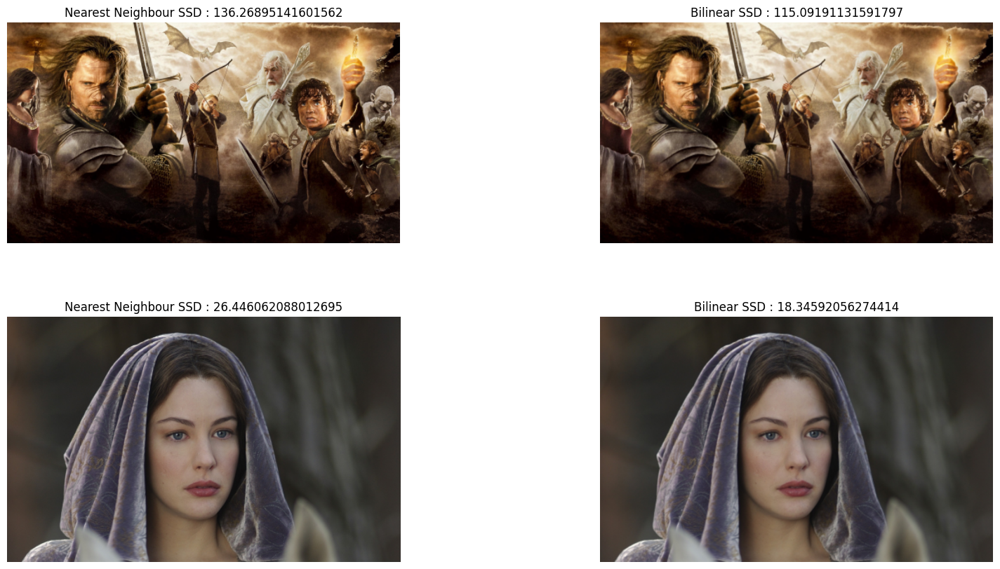

In [282]:
fig, axes  = plt.subplots(2,2, sharex='all', sharey='all', figsize=(20,10))

axes[0,0].imshow(im1_zoomed_nn)
axes[0,0].set_title(f'Nearest Neighbour SSD : {nn_SSD_im1}')
axes[0,0].axis('off')

axes[0,1].imshow(im1_zoomed_bi)
axes[0,1].set_title(f'Bilinear SSD : {bi_SSD_im1}')
axes[0,1].axis('off')

axes[1,0].imshow(im2_zoomed_nn)
axes[1,0].set_title(f'Nearest Neighbour SSD : {nn_SSD_im2}')
axes[1,0].axis('off')

axes[1,1].imshow(im2_zoomed_bi)
axes[1,1].set_title(f'Bilinear SSD : {bi_SSD_im2}')
axes[1,1].axis('off')

### Question 9

(np.float64(-0.5), np.float64(560.5), np.float64(840.5), np.float64(-0.5))

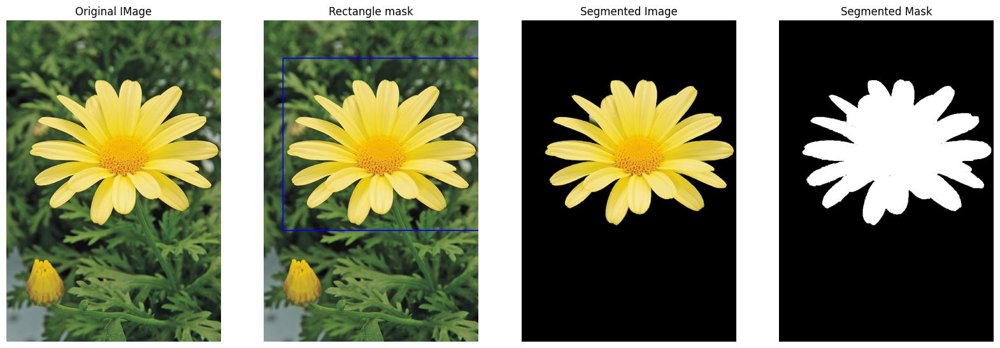

In [283]:
daisyImg=cv.imread("images/daisy.jpg")
#daisyImg=cv.cvtColor(daisyImg, cv.COLOR_BGR2RGB)

mask = np.zeros(daisyImg.shape[:2], np.uint8)#Initalizing a mask matches with the image

backgroundModel = np.zeros((1, 65), np.float64)
foregroundModel = np.zeros((1, 65), np.float64)

x, y, w, h = 50, 100, 520, 450
rectangle = (x,y,w,h)


daisy_with_rect = daisyImg.copy()
cv.rectangle(daisy_with_rect, (x, y), (x + w, y + h), (255, 0, 0), 2) # Draw an rectangle to locate the rectangle

cv.grabCut(daisyImg, mask, rectangle,backgroundModel, foregroundModel,3, cv.GC_INIT_WITH_RECT)

mask2 = np.where((mask == 2)|(mask == 0), 0, 1).astype('uint8')
image_segmented = daisyImg * mask2[:, :, np.newaxis]

fig, axes  = plt.subplots(1,4,figsize=(20,8))

axes[0].imshow(cv.cvtColor(daisyImg, cv.COLOR_BGR2RGB))
axes[0].set_title('Original IMage')
axes[0].axis('off')

axes[1].imshow(cv.cvtColor(daisy_with_rect, cv.COLOR_BGR2RGB))
axes[1].set_title("Rectangle mask")
axes[1].axis('off')

axes[2].imshow(cv.cvtColor(image_segmented, cv.COLOR_BGR2RGB))
axes[2].set_title("Segmented Image")
axes[2].axis('off')

axes[3].imshow(mask2, cmap='gray')
axes[3].set_title("Segmented Mask")
axes[3].axis('off')



(np.float64(-0.5), np.float64(560.5), np.float64(840.5), np.float64(-0.5))

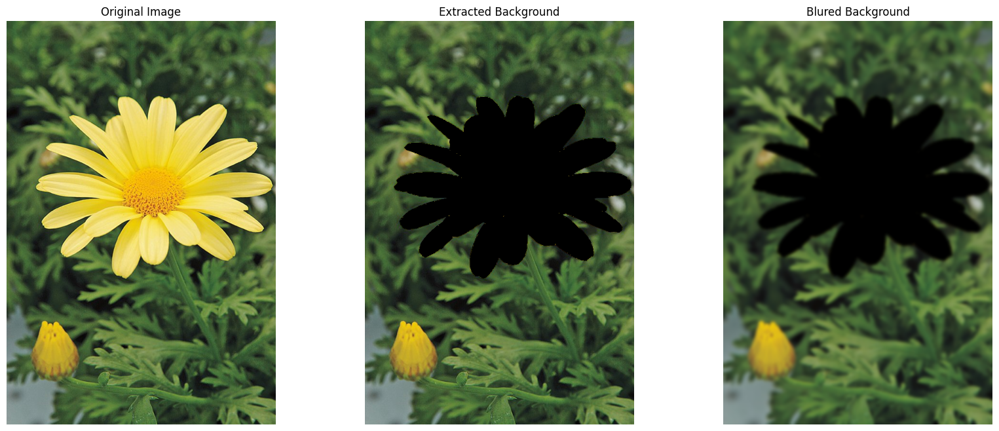

In [284]:
#background Taken 
background = cv.subtract(daisyImg, image_segmented)

#making the background Blure
bluredBack=cv.GaussianBlur(background,(29, 29), 3)

fig, axes  = plt.subplots(1,3,figsize=(20,8))

axes[0].imshow(cv.cvtColor(daisyImg, cv.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(cv.cvtColor(background, cv.COLOR_BGR2RGB))
axes[1].set_title("Extracted Background")
axes[1].axis('off')

axes[2].imshow(cv.cvtColor(bluredBack, cv.COLOR_BGR2RGB))
axes[2].set_title('Blured Background')
axes[2].axis('off')

(np.float64(-0.5), np.float64(560.5), np.float64(840.5), np.float64(-0.5))

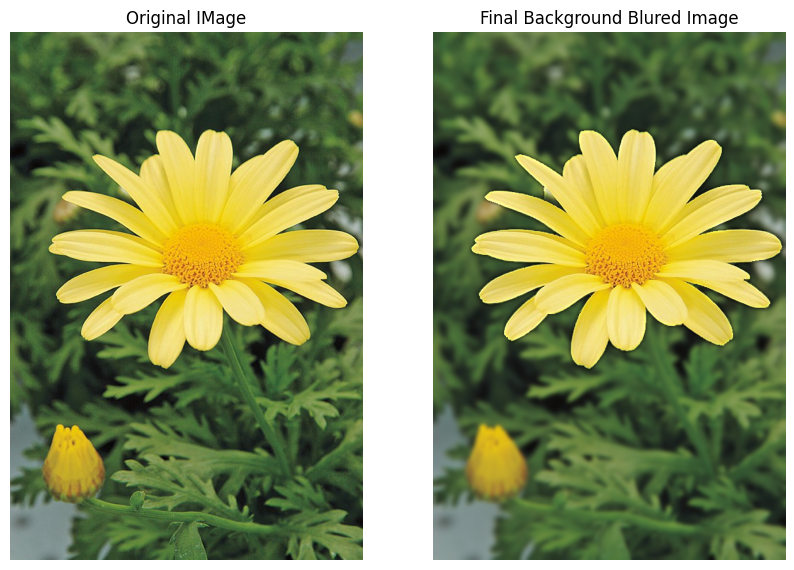

In [285]:
final=cv.add(bluredBack,image_segmented)

fig, axes  = plt.subplots(1,2,figsize=(10,8))

axes[0].imshow(cv.cvtColor(daisyImg, cv.COLOR_BGR2RGB))
axes[0].set_title("Original IMage")
axes[0].axis('off')

axes[1].imshow(cv.cvtColor(final, cv.COLOR_BGR2RGB))
axes[1].set_title("Final Background Blured Image")
axes[1].axis('off')

